<a href="https://colab.research.google.com/github/AliceNanL/BA820-project/blob/children_care_cost_M2_Nan/BA820_Childcare_M2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **B1 Team 11**
## Childcare EDA — Anna Wei, Nan Li, Pin-Chen Kuo, Stephanie Chen

In [ ]:
# Read datasets from Github
import pandas as pd

childcare_costs = pd.read_csv(
    'https://raw.githubusercontent.com/rfordatascience/tidytuesday/main/data/2023/2023-05-09/childcare_costs.csv'
)

counties = pd.read_csv(
    'https://raw.githubusercontent.com/rfordatascience/tidytuesday/main/data/2023/2023-05-09/counties.csv'
)

In [ ]:
print(childcare_costs.head())
print(counties.head())

   county_fips_code  study_year  unr_16  funr_16  munr_16  unr_20to64  \
0              1001        2008    5.42     4.41     6.32         4.6   
1              1001        2009    5.93     5.72     6.11         4.8   
2              1001        2010    6.21     5.57     6.78         5.1   
3              1001        2011    7.55     8.13     7.03         6.2   
4              1001        2012    8.60     8.88     8.29         6.7   

   funr_20to64  munr_20to64  flfpr_20to64  flfpr_20to64_under6  ...  memp_p  \
0          3.5          5.6          68.9                 66.9  ...   21.55   
1          4.6          5.0          70.8                 63.7  ...   21.96   
2          4.6          5.6          71.3                 67.0  ...   21.28   
3          6.3          6.1          70.2                 66.5  ...   22.80   
4          6.4          7.0          70.6                 67.1  ...   22.88   

   femp_p   mcsa  mfccsa  mc_infant  mc_toddler  mc_preschool  mfcc_infant  \
0    4.0

In [ ]:
childcare_costs['county_fips_code'] = childcare_costs['county_fips_code'].astype(str)
counties['county_fips_code'] = counties['county_fips_code'].astype(str)

merged_df = pd.merge(
    childcare_costs,
    counties,
    on='county_fips_code',
    how='inner'
)

#**Merged Data EDA**

In [ ]:
merged_df['_merge'] = pd.merge(
    childcare_costs,
    counties,
    on='county_fips_code',
    how='inner',
    indicator=True
)['_merge']

merged_df['_merge'].value_counts()

,count
_merge,
both,34567
left_only,0
right_only,0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
merged_df.to_csv(
    '/content/drive/MyDrive/BA820/childcare_cost_with_counties.csv',
    index=False
)

In [ ]:
merged_df.shape

(34567, 65)

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34567 entries, 0 to 34566
Data columns (total 65 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   county_fips_code           34567 non-null  object  
 1   study_year                 34567 non-null  int64   
 2   unr_16                     34567 non-null  float64 
 3   funr_16                    34567 non-null  float64 
 4   munr_16                    34567 non-null  float64 
 5   unr_20to64                 34567 non-null  float64 
 6   funr_20to64                34567 non-null  float64 
 7   munr_20to64                34567 non-null  float64 
 8   flfpr_20to64               34567 non-null  float64 
 9   flfpr_20to64_under6        34567 non-null  float64 
 10  flfpr_20to64_6to17         34567 non-null  float64 
 11  flfpr_20to64_under6_6to17  34567 non-null  float64 
 12  mlfpr_20to64               34567 non-null  float64 
 13  pr_f                       3456

We can see that the attributes: mcsa, mfccsa, mc_infant, mc_toddler, mc_preschool, mfcc_infant, mfcc_toddler, mfcc_preschool all have some missing values.

In [ ]:
merged_df.describe()

,study_year,unr_16,funr_16,munr_16,unr_20to64,funr_20to64,munr_20to64,flfpr_20to64,flfpr_20to64_under6,flfpr_20to64_6to17,...,memp_p,femp_p,mcsa,mfccsa,mc_infant,mc_toddler,mc_preschool,mfcc_infant,mfcc_toddler,mfcc_preschool
count,34567.000000,34567.000000,34567.00000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,...,34567.000000,34567.000000,23593.000000,23383.000000,23593.000000,23593.000000,23593.000000,23383.000000,23383.000000,23383.000000
mean,2012.999711,7.465902,7.02902,7.860291,6.900073,6.482007,7.275457,70.086125,68.821409,78.824106,...,23.456238,7.634403,101.234253,92.523582,146.051770,130.482768,122.232852,113.421657,106.759749,104.189510
std,3.162232,3.538619,3.56342,4.037657,3.446199,3.477956,3.990758,7.696499,11.758088,8.529813,...,7.956927,4.501044,34.552888,27.669904,53.698566,43.775370,38.538323,32.819372,29.982431,28.961701
min,2008.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,33.600000,0.000000,0.000000,...,0.000000,0.000000,18.980000,22.000000,27.730000,21.540000,21.540000,43.080000,43.080000,40.030000
25%,2010.000000,5.100000,4.64000,5.200000,4.600000,4.200000,4.700000,65.100000,62.600000,74.400000,...,17.610000,4.410000,78.650000,75.000000,108.750000,100.000000,95.880000,90.000000,85.085000,84.255000
50%,2013.000000,7.050000,6.59000,7.390000,6.500000,6.000000,6.800000,70.600000,69.600000,79.450000,...,23.400000,6.630000,96.530000,88.180000,134.500000,120.990000,113.990000,106.000000,100.250000,99.650000
75%,2016.000000,9.350000,8.88000,9.920000,8.700000,8.250000,9.200000,75.500000,76.100000,84.225000,...,28.930000,9.920000,119.380000,107.500000,166.330000,148.710000,139.300000,129.315000,124.950000,120.200000
max,2018.000000,36.110000,38.24000,39.740000,33.900000,44.500000,45.500000,100.000000,100.000000,100.000000,...,87.500000,66.480000,375.400000,308.000000,470.000000,419.000000,385.000000,430.940000,376.320000,331.340000


## **Gender Earning Gaps**

<Axes: >

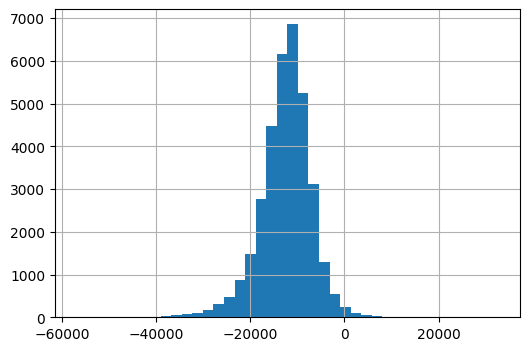

In [ ]:
merged_df['earnings_gap'] = merged_df['fme_2018'] - merged_df['mme_2018']
merged_df['earnings_gap'].hist(bins=40, figsize=(6,4))

There's an inequality in earnings distribution, with women earning less than men since the distribution is not centered at zero but towards large negative values.

## **Labor Fore Comparison**

<Axes: >

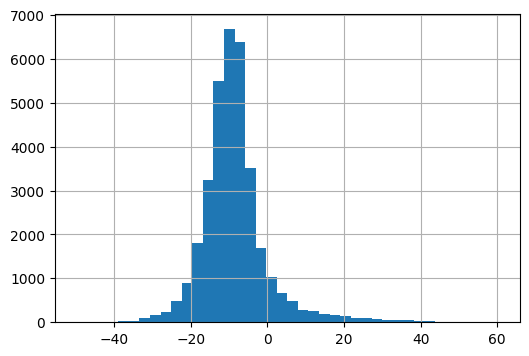

In [ ]:
merged_df['lfp_gap'] = merged_df['flfpr_20to64'] - merged_df['mlfpr_20to64']
merged_df['lfp_gap'].hist(bins=40, figsize=(6,4))

,lfp_child_gap
count,34567.000000
mean,-1.264716
std,10.052044
min,-77.000000
25%,-6.500000
50%,-1.500000
75%,4.100000
max,54.500000


**Labor force participation of the female population ages 20–64, ages 20–64 with children under 6, and ages 20–64 with children ages 6–17**

<Axes: >

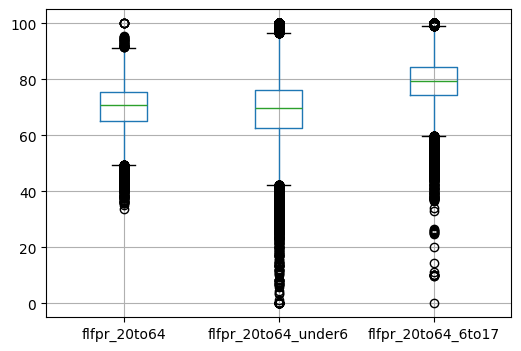

In [ ]:
merged_df[
    ['flfpr_20to64', 'flfpr_20to64_under6', 'flfpr_20to64_6to17']
].boxplot(figsize=(6,4))


The boxplots above indicate that from the three attributes, women ages 20-64 with children under 6 have the most outliers where there is very weak or no participation from them in the workforce.

# **Racial Demographics**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


demo_cols = [
    'one_race_w',
    'one_race_b',
    'one_race_i',
    'one_race_a',
    'one_race_h',
    'one_race_other',
    'two_races',
    'hispanic'
]


demo_means = merged_df[demo_cols].mean()

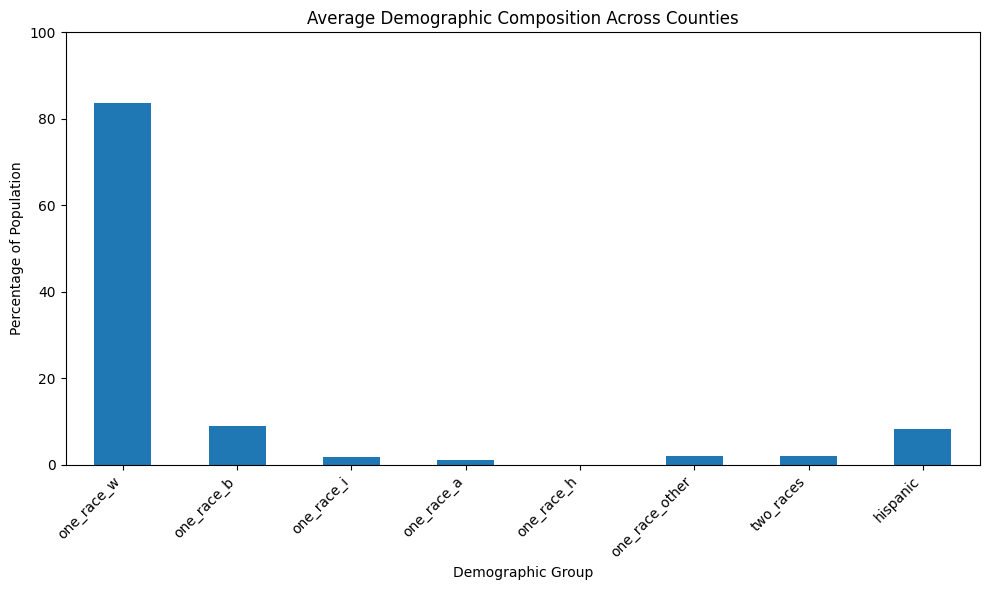

In [ ]:
plt.figure(figsize=(10,6))
demo_means.plot(kind='bar')

plt.title('Average Demographic Composition Across Counties')
plt.ylabel('Percentage of Population')
plt.xlabel('Demographic Group')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 100)

plt.tight_layout()
plt.show()

# **Houeshold Composition**

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

household_cols = [
    'h_under6_both_work',
    'h_under6_f_work',
    'h_under6_m_work',
    'h_under6_single_m',
    'h_6to17_both_work',
    'h_6to17_fwork',
    'h_6to17_mwork',
    'h_6to17_single_m'
]

household_totals = merged_df[household_cols].sum()

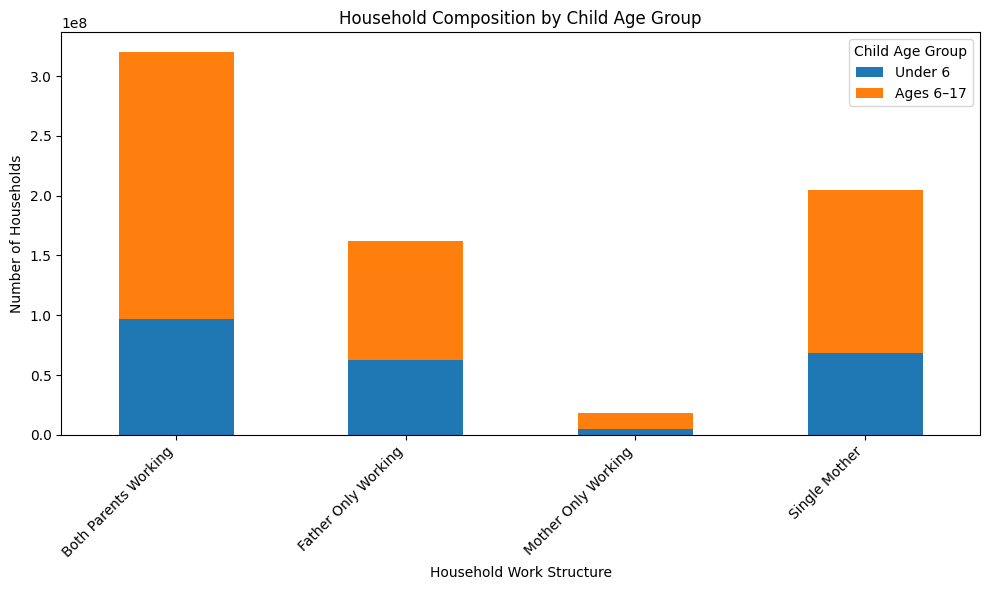

In [ ]:
household_df = pd.DataFrame({
    'Under 6': [
        household_totals['h_under6_both_work'],
        household_totals['h_under6_f_work'],
        household_totals['h_under6_m_work'],
        household_totals['h_under6_single_m']
    ],
    'Ages 6–17': [
        household_totals['h_6to17_both_work'],
        household_totals['h_6to17_fwork'],
        household_totals['h_6to17_mwork'],
        household_totals['h_6to17_single_m']
    ]
}, index=[
    'Both Parents Working',
    'Father Only Working',
    'Mother Only Working',
    'Single Mother'
])

household_df.plot(
    kind='bar',
    stacked=True,
    figsize=(10,6)
)

plt.title('Household Composition by Child Age Group')
plt.ylabel('Number of Households')
plt.xlabel('Household Work Structure')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Child Age Group')
plt.tight_layout()
plt.show()


Households with children under six are less likely to have both parents working and more likely to rely on single-earner or single-mother arrangements, while households with children aged 6–17 are predominantly dual-earner, reflecting reduced childcare constraints as children reach school age. It is also important to note that father-only working households far outnumber mother-only working households in both age groups, highlighting persistent gender asymmetries in caregiving and labor force participation.

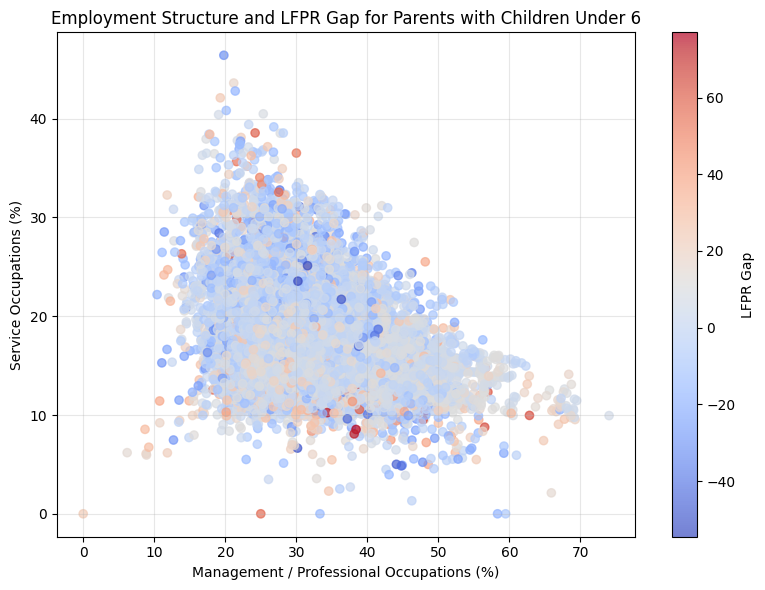

In [ ]:
import matplotlib.pyplot as plt

# Create LFPR gap
merged_df['lfpr_gap'] = (
    merged_df['flfpr_20to64'] - merged_df['flfpr_20to64_under6']
)

plt.figure(figsize=(8,6))

sc = plt.scatter(
    merged_df['emp_m'],
    merged_df['emp_service'],
    c=merged_df['lfpr_gap'],
    cmap = 'coolwarm',
    alpha=0.7
)

plt.xlabel('Management / Professional Occupations (%)')
plt.ylabel('Service Occupations (%)')
plt.title('Employment Structure and LFPR Gap for Parents with Children Under 6')

plt.colorbar(sc, label='LFPR Gap')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

The plot above depicts the Labor Force Participation Rate Gap, where warmer colors indicate a larger gap and cooler colors showing a smaller gap. We can see that there is a greater constrain and larger LFPR gap for parents to stay in the larbor force in service occupations. In contrast, counties with a greater share of management and professional occupations generally show smaller participation gaps, suggesting that job flexibility, wages, and workplace supports may mitigate childcare-related labor market penalties.

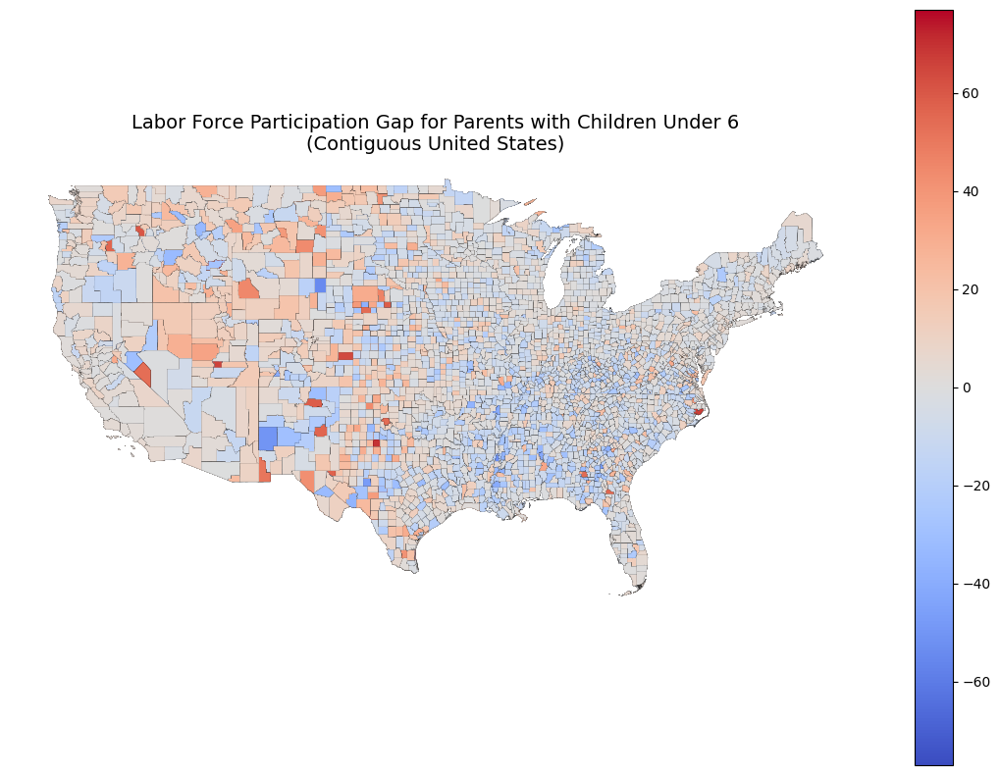

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

merged_df['lfpr_gap'] = (
    merged_df['flfpr_20to64'] - merged_df['flfpr_20to64_under6']
)

merged_df['county_fips_code'] = (
    merged_df['county_fips_code'].astype(str).str.zfill(5)
)


counties = gpd.read_file(
    "https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip"
)

counties['GEOID'] = counties['GEOID'].astype(str)


map_df = counties.merge(
    merged_df,
    left_on='GEOID',
    right_on='county_fips_code',
    how='left'
)


contiguous = map_df[
    ~map_df['STATEFP'].isin(['02', '15', '60', '66', '69', '72', '78'])
]


fig, ax = plt.subplots(1, 1, figsize=(14,10))


vmax = max(
    abs(contiguous['lfpr_gap'].min()),
    abs(contiguous['lfpr_gap'].max())
)

contiguous.plot(
    column='lfpr_gap',
    cmap='coolwarm',
    vmin=-vmax,
    vmax=vmax,
    linewidth=0.05,
    edgecolor='black',
    legend=True,
    ax=ax
)

ax.set_title(
    'Labor Force Participation Gap for Parents with Children Under 6\n(Contiguous United States)',
    fontsize=14
)
ax.axis('off')

plt.show()

The map reveals regional clustering in labor force participation gaps for parents with children under six. Larger gaps are more prevalent across parts of the Midwest and South, while smaller gaps are more common in Northern regions, along the West Coast, and in major metropolitan areas. This spatial pattern suggests that local labor market conditions and institutional supports play an important role in shaping parental labor force participation outcomes.

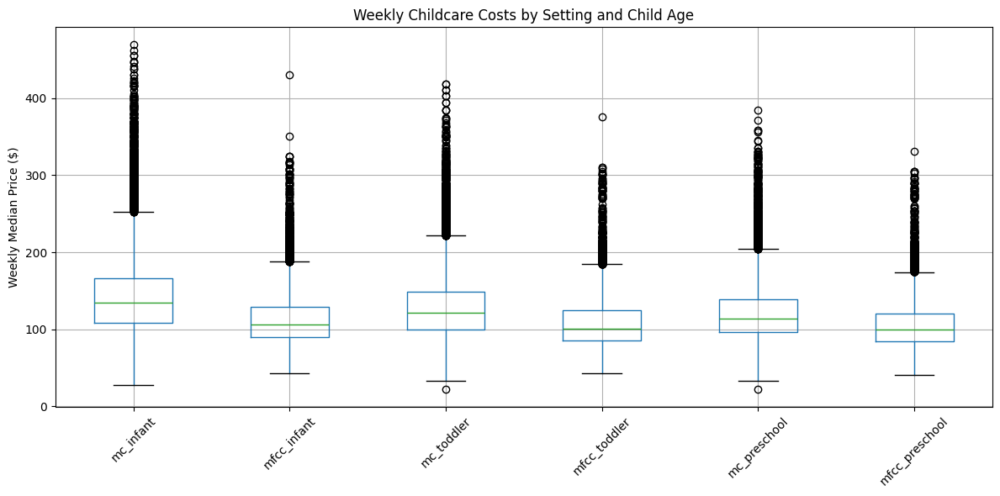

In [ ]:
import matplotlib.pyplot as plt

cols = [
    'mc_infant', 'mfcc_infant',
    'mc_toddler', 'mfcc_toddler',
    'mc_preschool', 'mfcc_preschool'
]

merged_df[cols].boxplot(figsize=(12,6), rot=45)

plt.title('Weekly Childcare Costs by Setting and Child Age')
plt.ylabel('Weekly Median Price ($)')
plt.tight_layout()
plt.show()


The boxplots above are comparing the weekly childcare cost distribution. The presence of high outliers indicates that childcare costs can be exceptionally high in certain counties(metropolitan places), particularly for infants and center-based care. While most counties fall within a more moderate cost range, this variation highlights substantial geographic inequality in childcare affordability, which may contribute to uneven labor force participation outcomes among parents with young children.

# **M2 -EDA**

**Data Dictionary**


> childcare_costs.csv



| Variable                  | Class  | Description                                                                                                                                                                                         |
| ------------------------- | ------ | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| county_fips_code          | object | Four- or five-digit number that uniquely identifies the county in a state. The first two digits (for five-digit numbers) or one digit (for four-digit numbers) refer to the FIPS code of the state. |
| study_year                | number | Year the data collection began for the market rate survey and in which ACS data is representative of, or the study publication date.                                                                |
| unr_16                    | number | Unemployment rate of the population aged 16 years old or older.                                                                                                                                     |
| funr_16                   | number | Unemployment rate of the female population aged 16 years old or older.                                                                                                                              |
| munr_16                   | number | Unemployment rate of the male population aged 16 years old or older.                                                                                                                                |
| unr_20to64                | number | Unemployment rate of the population aged 20 to 64 years old.                                                                                                                                        |
| funr_20to64               | number | Unemployment rate of the female population aged 20 to 64 years old.                                                                                                                                 |
| munr_20to64               | number | Unemployment rate of the male population aged 20 to 64 years old.                                                                                                                                   |
| flfpr_20to64              | number | Labor force participation rate of the female population aged 20 to 64 years old.                                                                                                                    |
| flfpr_20to64_under6       | number | Labor force participation rate of females aged 20–64 with children under 6 years old.                                                                                                               |
| flfpr_20to64_6to17        | number | Labor force participation rate of females aged 20–64 with children between 6 and 17 years old.                                                                                                      |
| flfpr_20to64_under6_6to17 | number | Labor force participation rate of females aged 20–64 with children under 6 and between 6 and 17 years old.                                                                                          |
| mlfpr_20to64              | number | Labor force participation rate of the male population aged 20 to 64 years old.                                                                                                                      |
| pr_f                      | number | Poverty rate for families.                                                                                                                                                                          |
| pr_p                      | number | Poverty rate for individuals.                                                                                                                                                                       |
| mhi_2018                  | number | Median household income expressed in 2018 dollars.                                                                                                                                                  |
| me_2018                   | number | Median earnings expressed in 2018 dollars for the population aged 16 years old or older.                                                                                                            |
| fme_2018                  | number | Median earnings for females expressed in 2018 dollars for the population aged 16 years old or older.                                                                                                |
| mme_2018                  | number | Median earnings for males expressed in 2018 dollars for the population aged 16 years old or older.                                                                                                  |
| total_pop                 | number | Total population count.                                                                                                                                                                             |
| one_race                  | number | Percent of population identifying as one race.                                                                                                                                                      |
| one_race_w                | number | Percent identifying as one race and White or Caucasian only.                                                                                                                                        |
| one_race_b                | number | Percent identifying as one race and Black or African American only.                                                                                                                                 |
| one_race_i                | number | Percent identifying as one race and American Indian or Alaska Native only.                                                                                                                          |
| one_race_a                | number | Percent identifying as one race and Asian only.                                                                                                                                                     |
| one_race_h                | number | Percent identifying as one race and Native Hawaiian or Pacific Islander only.                                                                                                                       |
| one_race_other            | number | Percent identifying as one race not listed above.                                                                                                                                                   |
| two_races                 | number | Percent identifying as two or more races.                                                                                                                                                           |
| hispanic                  | number | Percent identifying as Hispanic or Latino regardless of race.                                                                                                                                       |
| households                | number | Number of households.                                                                                                                                                                               |
| h_under6_both_work        | number | Households with children under 6 where both parents work.                                                                                                                                           |
| h_under6_f_work           | number | Households with children under 6 where only the father works.                                                                                                                                       |
| h_under6_m_work           | number | Households with children under 6 where only the mother works.                                                                                                                                       |
| h_under6_single_m         | number | Households with children under 6 with a single mother.                                                                                                                                              |
| h_6to17_both_work         | number | Households with children aged 6–17 where both parents work.                                                                                                                                         |
| h_6to17_fwork             | number | Households with children aged 6–17 where only the father works.                                                                                                                                     |
| h_6to17_mwork             | number | Households with children aged 6–17 where only the mother works.                                                                                                                                     |
| h_6to17_single_m          | number | Households with children aged 6–17 with a single mother.                                                                                                                                            |
| emp_m                     | number | Percent of civilians employed in management, business, science, and arts occupations.                                                                                                               |
| memp_m                    | number | Percent of male civilians employed in management, business, science, and arts occupations.                                                                                                          |
| femp_m                    | number | Percent of female civilians employed in management, business, science, and arts occupations.                                                                                                        |
| emp_service               | number | Percent of civilians employed in service occupations.                                                                                                                                               |
| memp_service              | number | Percent of male civilians employed in service occupations.                                                                                                                                          |
| femp_service              | number | Percent of female civilians employed in service occupations.                                                                                                                                        |
| emp_sales                 | number | Percent of civilians employed in sales and office occupations.                                                                                                                                      |
| memp_sales                | number | Percent of male civilians employed in sales and office occupations.                                                                                                                                 |
| femp_sales                | number | Percent of female civilians employed in sales and office occupations.                                                                                                                               |
| emp_n                     | number | Percent employed in natural resources, construction, and maintenance occupations.                                                                                                                   |
| memp_n                    | number | Percent of males employed in natural resources, construction, and maintenance occupations.                                                                                                          |
| femp_n                    | number | Percent of females employed in natural resources, construction, and maintenance occupations.                                                                                                        |
| emp_p                     | number | Percent employed in production, transportation, and material moving occupations.                                                                                                                    |
| memp_p                    | number | Percent of males employed in production, transportation, and material moving occupations.                                                                                                           |
| femp_p                    | number | Percent of females employed in production, transportation, and material moving occupations.                                                                                                         |
| mcsa                      | number | Weekly full-time median price for center-based care for school-age children.                                                                                                                        |
| mfccsa                    | number | Weekly full-time median price for family childcare for school-age children.                                                                                                                         |
| mc_infant                 | number | Weekly full-time median price for center-based infant care (0–23 months).                                                                                                                           |
| mc_toddler                | number | Weekly full-time median price for center-based toddler care (24–35 months).                                                                                                                         |
| mc_preschool              | number | Weekly full-time median price for center-based preschool care (36–54 months).                                                                                                                       |
| mfcc_infant               | number | Weekly full-time median price for family childcare for infants (0–23 months).                                                                                                                       |
| mfcc_toddler              | number | Weekly full-time median price for family childcare for toddlers (24–35 months).                                                                                                                     |
| mfcc_preschool            | number | Weekly full-time median price for family childcare for preschoolers (36–54 months).                                                                        



> counties.csv



| Variable           | Class     | Description                                                                |
| ------------------ | --------- | -------------------------------------------------------------------------- |
| county_fips_code   | number    | Four- or five-digit number that uniquely identifies the county in a state. |
| county_name        | character | Full name of the county.                                                   |
| state_name         | character | Full name of the state in which the county is located.                     |
| state_abbreviation | character | Two-letter state abbreviation.                                             |


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34567 entries, 0 to 34566
Data columns (total 65 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   county_fips_code           34567 non-null  object  
 1   study_year                 34567 non-null  int64   
 2   unr_16                     34567 non-null  float64 
 3   funr_16                    34567 non-null  float64 
 4   munr_16                    34567 non-null  float64 
 5   unr_20to64                 34567 non-null  float64 
 6   funr_20to64                34567 non-null  float64 
 7   munr_20to64                34567 non-null  float64 
 8   flfpr_20to64               34567 non-null  float64 
 9   flfpr_20to64_under6        34567 non-null  float64 
 10  flfpr_20to64_6to17         34567 non-null  float64 
 11  flfpr_20to64_under6_6to17  34567 non-null  float64 
 12  mlfpr_20to64               34567 non-null  float64 
 13  pr_f                       3456

As we can see from the summary above, nearly 30% of values are missing for childcare cost variables:

In [ ]:
# Impute the missing values

childcare_cost_cols = [
    'mcsa', 'mfccsa', 'mc_infant', 'mfcc_infant',
    'mc_toddler', 'mfcc_toddler', 'mc_preschool', 'mfcc_preschool','h_under6_single_m','h_6to17_single_m'
]

for col in childcare_cost_cols:
    median_val = merged_df[col].median()
    merged_df[col].fillna(median_val, inplace=True)

print("Missing values after imputation for childcare cost columns:")
print(merged_df[childcare_cost_cols].isnull().sum())


Missing values after imputation for childcare cost columns:
mcsa                 0
mfccsa               0
mc_infant            0
mfcc_infant          0
mc_toddler           0
mfcc_toddler         0
mc_preschool         0
mfcc_preschool       0
h_under6_single_m    0
h_6to17_single_m     0
dtype: int64


/tmp/ipython-input-3787318522.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_df[col].fillna(median_val, inplace=True)


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34567 entries, 0 to 34566
Data columns (total 70 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   county_fips_code                  34567 non-null  object  
 1   study_year                        34567 non-null  int64   
 2   unr_16                            34567 non-null  float64 
 3   funr_16                           34567 non-null  float64 
 4   munr_16                           34567 non-null  float64 
 5   unr_20to64                        34567 non-null  float64 
 6   funr_20to64                       34567 non-null  float64 
 7   munr_20to64                       34567 non-null  float64 
 8   flfpr_20to64                      34567 non-null  float64 
 9   flfpr_20to64_under6               34567 non-null  float64 
 10  flfpr_20to64_6to17                34567 non-null  float64 
 11  flfpr_20to64_under6_6to17         34567 non-null  floa

In [ ]:

# print the result for all columns
pd.set_option('display.max_columns', None)
merged_df.describe()




,study_year,unr_16,funr_16,munr_16,unr_20to64,funr_20to64,munr_20to64,flfpr_20to64,flfpr_20to64_under6,flfpr_20to64_6to17,flfpr_20to64_under6_6to17,mlfpr_20to64,pr_f,pr_p,mhi_2018,me_2018,fme_2018,mme_2018,total_pop,one_race,one_race_w,one_race_b,one_race_i,one_race_a,one_race_h,one_race_other,two_races,hispanic,households,h_under6_both_work,h_under6_f_work,h_under6_m_work,h_under6_single_m,h_6to17_both_work,h_6to17_fwork,h_6to17_mwork,h_6to17_single_m,emp_m,memp_m,femp_m,emp_service,memp_service,femp_service,emp_sales,memp_sales,femp_sales,emp_n,memp_n,femp_n,emp_p,memp_p,femp_p,mcsa,mfccsa,mc_infant,mc_toddler,mc_preschool,mfcc_infant,mfcc_toddler,mfcc_preschool
count,34567.000000,34567.000000,34567.00000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,3.456700e+04,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,3.456700e+04,34567.000000,34567.000000,34567.000000,34565.000000,34567.000000,34567.000000,34567.000000,34565.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000
mean,2012.999711,7.465902,7.02902,7.860291,6.900073,6.482007,7.275457,70.086125,68.821409,78.824106,66.940759,78.637814,11.739125,16.038131,50446.777363,29404.295539,23475.169710,35997.433918,9.914222e+04,97.922863,83.636247,8.971213,1.895634,1.216209,0.082101,2.117914,2.077146,8.401054,3.686299e+04,2791.610004,1821.628808,141.109064,1992.249964,6480.568548,2874.374374,390.113056,3924.511558,30.720191,26.495400,35.509491,17.909716,13.122111,23.424303,22.244044,13.660359,32.062036,13.076182,23.265887,1.369745,16.049861,23.456238,7.634403,99.740792,91.118235,142.384424,127.469095,119.615990,111.020413,104.653548,102.720772
std,3.162232,3.538619,3.56342,4.037657,3.446199,3.477956,3.990758,7.696499,11.758088,8.529813,13.285061,10.802983,5.681003,6.511816,13279.833788,5715.192737,4903.836942,7643.855532,3.177786e+05,1.952523,16.683515,14.510260,7.517786,2.633768,0.593602,3.779858,1.952520,13.284933,1.116470e+05,8709.085062,6740.389344,472.557239,7009.934446,19294.344762,10901.264277,1187.096922,13966.245194,6.503783,8.013214,6.073988,3.602868,4.476415,4.696024,3.352621,3.761803,4.480591,4.257660,6.763236,1.430796,5.935141,7.956927,4.501044,28.629667,22.848012,44.687670,36.433895,32.068735,27.215108,24.846785,23.914409
min,2008.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,33.600000,0.000000,0.000000,0.000000,8.200000,0.000000,0.000000,19841.920000,4947.040000,5019.300000,4238.080000,4.100000e+01,59.500000,3.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.200000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.980000,22.000000,27.730000,21.540000,21.540000,43.080000,43.080000,40.030000
25%,2010.000000,5.100000,4.64000,5.200000,4.600000,4.200000,4.700000,65.100000,62.600000,74.400000,59.800000,74.200000,7.700000,11.400000,41839.215000,25955.055000,20613.100000,31447.505000,1.101450e+04,97.500000,77.000000,0.600000,0.200000,0.200000,0.000000,0.300000,1.100000,1.700000,4.236000e+03,260.000000,146.000000,5.000000,176.000000,685.000000,247.000000,39.000000,351.000000,26.340000,20.945000,31.560000,15.590000,10.270000,20.410000,20.150000,11.210000,29.390000,10.200000,18.680000,0.590000,11.640000,17.610000,4.410000,87.850000,80.000000,120.000000,109.620000,103.615000,98.080000,92.500000,90.100000
50%,2013.000000,7.050000,6.59000,7.390000,6.500000,6.000000,6.800000,70.600000,69.600000,79.450000,67.660000,81.00000

In [ ]:
#Describe the result by float
pd.set_option('display.float_format', '{:.2f}'.format)
merged_df['households'].describe()

,households
count,34567.00
mean,36862.99
std,111646.96
min,22.00
25%,4236.00
50%,9814.00
75%,25493.50
max,3306109.00


In [ ]:
merged_df['study_year'].value_counts()

,count
study_year,
2009,3143
2010,3143
2011,3143
2013,3143
2012,3143
2008,3142
2014,3142
2015,3142
2016,3142


## Calculate Childcare Cost as Percentage of Household Income




To categorize counties into income groups, I will calculate the tertiles of the 'mhi_2018' column and then use these tertiles to create a new categorical column named 'income_group'.



In [ ]:
merged_df['income_group'] = pd.qcut(
    merged_df['mhi_2018'],
    q=3,
    labels=['Low Income', 'Middle Income', 'High Income']
)

print("Value counts for 'income_group':")
print(merged_df['income_group'].value_counts())
print("\nFirst 5 rows with new feature 'income_group':")
print(merged_df[['mhi_2018', 'income_group']].head())

Value counts for 'income_group':
income_group
Low Income       11523
High Income      11523
Middle Income    11521
Name: count, dtype: int64

First 5 rows with new feature 'income_group':
   mhi_2018 income_group
0  58462.55  High Income
1  60211.71  High Income
2  61775.80  High Income
3  60366.88  High Income
4  59150.30  High Income


Calculate each type of childcare cost as proportion of median household income in the county.

In [ ]:
childcare_cost_types = [
    'mcsa', 'mfccsa', 'mc_infant', 'mc_toddler',
    'mc_preschool', 'mfcc_infant', 'mfcc_toddler', 'mfcc_preschool'
]

for col in childcare_cost_types:
    new_col_name = f'{col}_as_percent_mhi'
    merged_df[new_col_name] = ((merged_df[col] * 52) / merged_df['mhi_2018']) * 100

# Display the newly created columns along with mhi_2018 to verify
print("First 5 rows with new childcare cost percentage features:")
display(merged_df[['mhi_2018'] + [f'{col}_as_percent_mhi' for col in childcare_cost_types]].head())

First 5 rows with new childcare cost percentage features:


,mhi_2018,mcsa_as_percent_mhi,mfccsa_as_percent_mhi,mc_infant_as_percent_mhi,mc_toddler_as_percent_mhi,mc_preschool_as_percent_mhi,mfcc_infant_as_percent_mhi,mfcc_toddler_as_percent_mhi,mfcc_preschool_as_percent_mhi
0,58462.55,7.20,7.24,9.33,9.33,7.64,7.42,7.42,7.24
1,60211.71,7.20,7.40,9.08,9.08,7.56,7.55,7.55,7.40
2,61775.80,7.23,7.57,8.86,8.86,7.51,7.69,7.69,7.57
3,60366.88,7.62,8.12,9.08,9.08,7.83,8.21,8.21,8.12
4,59150.30,7.99,8.66,9.28,9.28,8.14,8.72,8.72,8.66


/tmp/ipython-input-2413738038.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Income Group', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


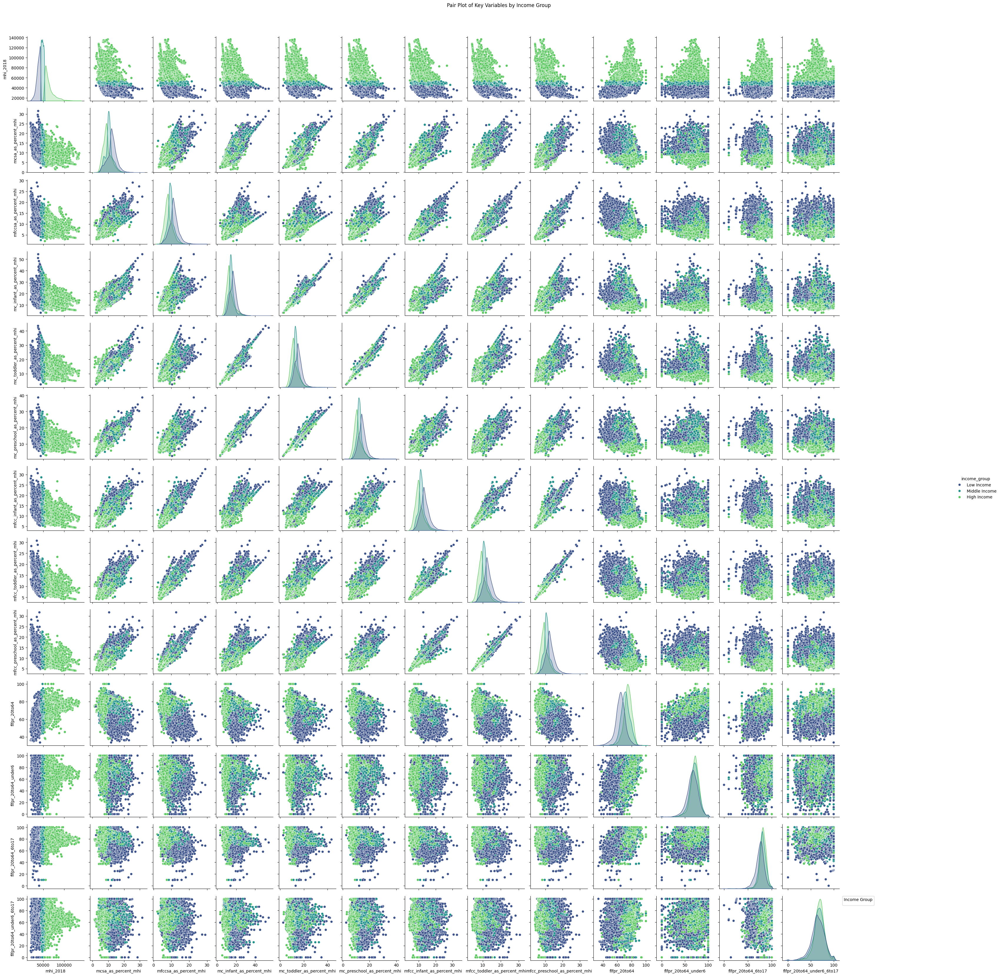

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the base childcare cost types (used to generate the percentage column names)
childcare_cost_types = [
    'mcsa', 'mfccsa', 'mc_infant', 'mc_toddler',
    'mc_preschool', 'mfcc_infant', 'mfcc_toddler', 'mfcc_preschool'
]

# Generate the list of new percentage-based childcare cost column names
childcare_percentage_cols = [f'{col}_as_percent_mhi' for col in childcare_cost_types]

# Select the relevant columns for the pair plot, including the new feature
pair_plot_cols = [
    'mhi_2018',
    *childcare_percentage_cols, # Unpack the list of percentage columns here
    'flfpr_20to64', # Include general female LFP rate
    'flfpr_20to64_under6',
    'flfpr_20to64_6to17',
    'flfpr_20to64_under6_6to17',
    'income_group'
]

# Create a subset DataFrame for the pair plot
df_for_pair_plot = merged_df[pair_plot_cols]

# Generate the pair plot, differentiating by 'income_group'
g = sns.pairplot(df_for_pair_plot, hue='income_group', palette='viridis')
plt.suptitle('Pair Plot of Key Variables by Income Group', y=1.02) # Add a title to the plot

# Adjust the legend position
plt.legend(title='Income Group', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for the legend
plt.show()

# **Kmeans**

Perform K-Means clustering on the `merged_df` DataFrame using the columns 'mhi_2018', 'mc_infant', 'mcsa', 'flfpr_20to64', 'flfpr_20to64_under6', 'flfpr_20to64_6to17', and 'flfpr_20to64_under6_6to17'. First, impute missing values in these columns with the median and scale the features. Then, determine the optimal number of clusters using the Elbow Method. Finally, analyze and visualize the characteristics of the resulting clusters, focusing on income levels, childcare costs, and female labor force participation rates, using radar charts and bar charts, and summarize the key findings.

## Prepare Data for Clustering



In [ ]:
from sklearn.preprocessing import StandardScaler

# Create a list named `selected_columns`,only use data from 2018

selected_columns = ['mhi_2018',
                    *childcare_percentage_cols,
                    'flfpr_20to64',
                    'flfpr_20to64_under6',
                    'flfpr_20to64_6to17',
                    'flfpr_20to64_under6_6to17']

#  Create a new DataFrame `df_clustering`
df_clustering = merged_df[selected_columns].copy()

# Instantiate StandardScaler and fit it to df_clustering
scaler = StandardScaler()
scaler.fit(df_clustering)

# Transform df_clustering and store in df_scaled_clustering
df_scaled_clustering = pd.DataFrame(
    scaler.transform(df_clustering),
    columns=df_clustering.columns
)

print("\nFirst 5 rows of df_scaled_clustering:")
print(df_scaled_clustering.head())


First 5 rows of df_scaled_clustering:
   mhi_2018  mcsa_as_percent_mhi  mfccsa_as_percent_mhi  \
0      0.60                -1.14                  -0.97   
1      0.74                -1.13                  -0.90   
2      0.85                -1.12                  -0.84   
3      0.75                -1.00                  -0.63   
4      0.66                -0.87                  -0.42   

   mc_infant_as_percent_mhi  mc_toddler_as_percent_mhi  \
0                     -1.40                      -1.21   
1                     -1.46                      -1.28   
2                     -1.52                      -1.34   
3                     -1.46                      -1.28   
4                     -1.41                      -1.22   

   mc_preschool_as_percent_mhi  mfcc_infant_as_percent_mhi  \
0                        -1.62                       -1.52   
1                        -1.64                       -1.48   
2                        -1.66                       -1.43   
3        

## Determine Optimal Number of Clusters


Apply the Elbow Method to the prepared and scaled dataset to determine the optimal number of clusters for K-Means.


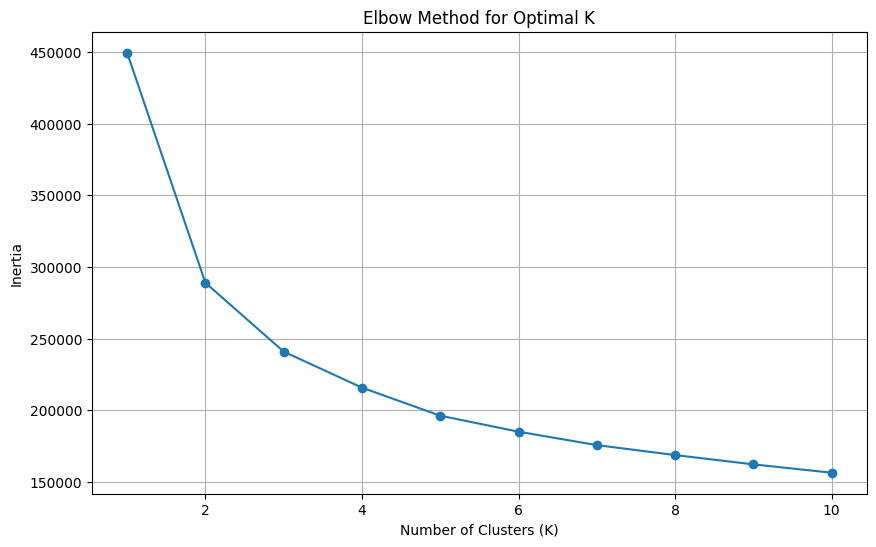

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []

for k in range(1, 11):
    model = KMeans(n_clusters=k, random_state=42, n_init='auto')
    model.fit(df_scaled_clustering)
    inertia.append(model.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

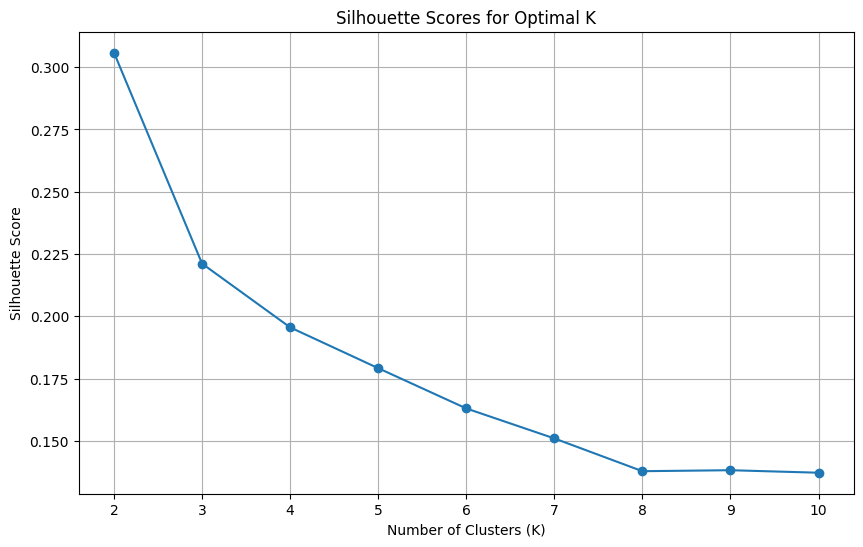

In [ ]:
# Apply silhouette_score
from sklearn.metrics import silhouette_score
silhouette_scores = []

# Calculate silhouette scores for k from 2 to 10 (silhouette score is not defined for k=1)
for k in range(2, 11):
    model = KMeans(n_clusters=k, random_state=42, n_init='auto')
    cluster_labels = model.fit_predict(df_scaled_clustering)
    score = silhouette_score(df_scaled_clustering, cluster_labels)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

After running this code, you should examine the plot to find the highest silhouette score. The `K` value corresponding to this peak score is another strong candidate for the optimal number of clusters, which can be compared with the result from the Elbow Method.

### Optimal Number of Clusters

From the elbow plot and the silhouette plot, we observe that the decrease in inertia becomes less steep after approximately **K=3**, and the silhouette score peaks at **k=2**. This suggests that **2** is the optimal number of clusters for this dataset.



In [ ]:
from sklearn.cluster import KMeans

n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')

# Apply K-Means to the scaled data and get cluster labels
cluster_labels = kmeans.fit_predict(df_scaled_clustering)

# Assign the cluster labels back to the correct rows in merged_df
merged_df['cluster_labels'] = cluster_labels

print("Cluster labels assigned to merged_df:")
print(merged_df['cluster_labels'].value_counts(dropna=False))

Cluster labels assigned to merged_df:
cluster_labels
0    20814
1    13753
Name: count, dtype: int64



To understand the characteristics of each cluster, I calculate the mean values of the original (unscaled) features for each cluster. This will provide interpretable profiles for income, childcare costs, and labor force participation rates.



In [ ]:
cluster_means = merged_df.groupby('cluster_labels')[selected_columns].mean()

print("Mean values for each cluster (unscaled features):")
print(cluster_means)

Mean values for each cluster (unscaled features):
                mhi_2018  mcsa_as_percent_mhi  mfccsa_as_percent_mhi  \
cluster_labels                                                         
0               55226.72                 9.01                   8.25   
1               43212.74                13.14                  12.05   

                mc_infant_as_percent_mhi  mc_toddler_as_percent_mhi  \
cluster_labels                                                        
0                                  12.74                      11.49   
1                                  18.59                      16.61   

                mc_preschool_as_percent_mhi  mfcc_infant_as_percent_mhi  \
cluster_labels                                                            
0                                     10.83                       10.10   
1                                     15.58                       14.49   

                mfcc_toddler_as_percent_mhi  mfcc_preschool_as_percent_mhi 


To visualize the characteristics of each cluster across multiple features simultaneously, a radar chart is a suitable choice. This will allow for a clear comparison of the cluster profiles in terms of income, childcare costs, and labor force participation rates. I will prepare the data and generate a radar chart for each cluster.



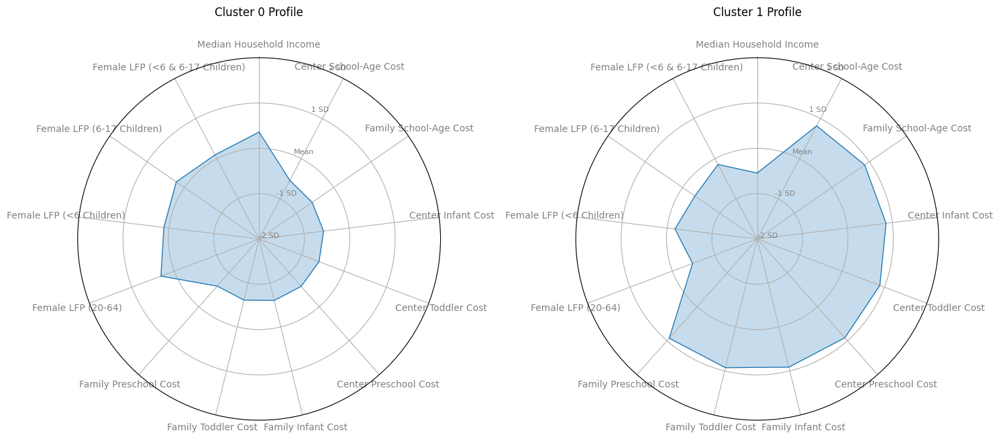

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data for radar chart using scaled cluster centers for better comparison
# The 'selected_columns' list already contains the features for clustering
features = selected_columns
num_features = len(features)

# Get the scaled cluster centroids from the KMeans model
scaled_cluster_centroids = kmeans.cluster_centers_

# Create shorter, more readable labels for the features
feature_labels = [
    'Median Household Income',
    'Center School-Age Cost',
    'Family School-Age Cost',
    'Center Infant Cost',
    'Center Toddler Cost',
    'Center Preschool Cost',
    'Family Infant Cost',
    'Family Toddler Cost',
    'Family Preschool Cost',
    'Female LFP (20-64)',
    'Female LFP (<6 Children)',
    'Female LFP (6-17 Children)',
    'Female LFP (<6 & 6-17 Children)'
]

# Add the first feature to the end to close the circle in the radar chart
# This ensures the polygon connects back to the start
angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1] # Complete the circle
feature_labels_plot = feature_labels + [feature_labels[0]]

fig, axes = plt.subplots(figsize=(15, 10), nrows=1, ncols=2, subplot_kw=dict(polar=True))
axes = axes.flatten()

# Plot each cluster on a separate radar chart
for i, cluster_label in enumerate(cluster_means.index):
    values = scaled_cluster_centroids[i].tolist()
    values += values[:1] # Complete the circle

    ax = axes[i]
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f'Cluster {cluster_label}')
    ax.fill(angles, values, alpha=0.25)
    ax.set_title(f'Cluster {cluster_label} Profile', size=12, color='black', y=1.1)

    # Set radial axis ticks (y-axis for polar plot)
    ax.set_yticks([-2, -1, 0, 1, 2]) # Example ticks for scaled data
    ax.set_yticklabels(['-2 SD', '-1 SD', 'Mean', '1 SD', '2 SD'], color='grey', size=8)
    ax.tick_params(axis='y', pad=10) # Adjust padding for y-axis labels

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_labels, color='grey', size=10)
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

plt.tight_layout()
plt.show()

# **Hierarchical Clustering**

Perform hierarchical clustering on the `df_scaled_clustering` DataFrame (which includes 'mhi_2018', all childcare cost percentage columns, and all female labor force participation rate columns across all years). First, compute and visualize a dendrogram to identify the optimal number of clusters. Then, apply Agglomerative Hierarchical Clustering using the determined optimal number of clusters and assign the resulting cluster labels to the `merged_df`. Finally, calculate the mean values of the original (unscaled) features for each cluster, visualize these profiles using bar charts, summarize the characteristics of each hierarchical cluster, and provide a comprehensive summary of all clustering analyses performed.


To determine the optimal number of clusters for hierarchical clustering, I will compute and visualize a dendrogram using the `ward` method on the `df_scaled_clustering` dataset.



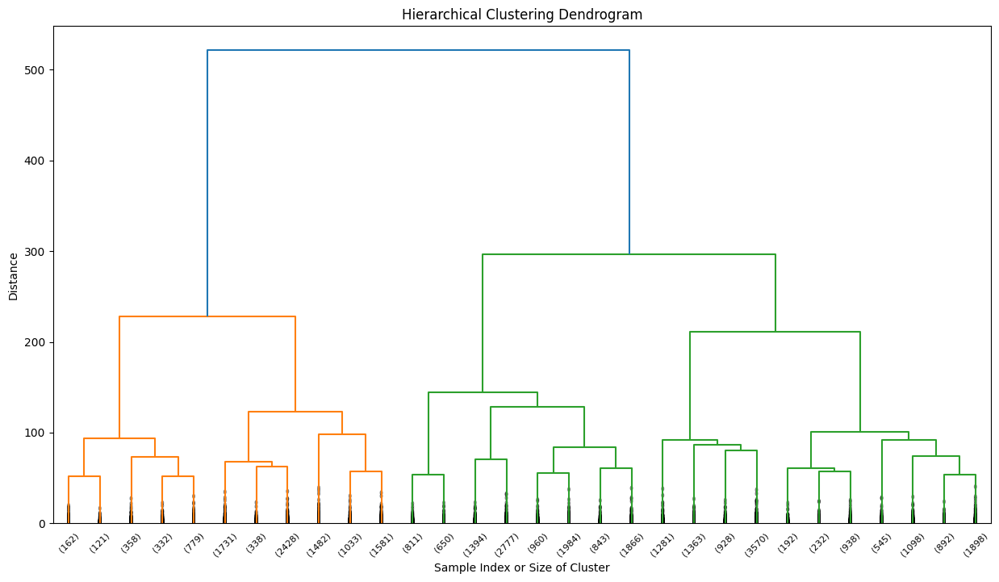

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Compute the linkage matrix using the ward method
linked_data = linkage(df_scaled_clustering, method='ward')

# Create a dendrogram
plt.figure(figsize=(15, 8))
dendrogram(
    linked_data,
    truncate_mode='lastp',
    p=30, # Show only the last 30 merged clusters
    leaf_rotation=45.,
    leaf_font_size=8.,
    show_contracted=True,
)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index or Size of Cluster')
plt.ylabel('Distance')
plt.show()


Based on the previously generated dendrogram, I will apply Agglomerative Hierarchical Clustering with an optimal number of 2 clusters, then assign these cluster labels to the `merged_df`.



In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Determine the number of clusters from the dendrogram (e.g., 2 or 3 based on visual inspection)
n_clusters_hierarchical = 2

# Apply Agglomerative Hierarchical Clustering
ah_clustering = AgglomerativeClustering(
    n_clusters=n_clusters_hierarchical,
    linkage='ward'
)
h_cluster_labels = ah_clustering.fit_predict(df_scaled_clustering)

# Assign the hierarchical cluster labels back to merged_df
merged_df['h_cluster_labels'] = h_cluster_labels

print("Hierarchical cluster labels assigned to merged_df:")
print(merged_df['h_cluster_labels'].value_counts(dropna=False))

Hierarchical cluster labels assigned to merged_df:
h_cluster_labels
0    24222
1    10345
Name: count, dtype: int64



To understand the characteristics of each hierarchical cluster, I need to calculate the mean values of the original (unscaled) features for each cluster. This will provide interpretable profiles for income, childcare costs, and labor force participation rates based on the hierarchical clustering.



In [ ]:
h_cluster_means = merged_df.groupby('h_cluster_labels')[selected_columns].mean()

print("Mean values for each hierarchical cluster (unscaled features):")
print(h_cluster_means)

Mean values for each hierarchical cluster (unscaled features):
                  mhi_2018  mcsa_as_percent_mhi  mfccsa_as_percent_mhi  \
h_cluster_labels                                                         
0                 53603.90                 9.38                   8.62   
1                 43054.63                13.61                  12.44   

                  mc_infant_as_percent_mhi  mc_toddler_as_percent_mhi  \
h_cluster_labels                                                        
0                                    13.29                      11.96   
1                                    19.25                      17.19   

                  mc_preschool_as_percent_mhi  mfcc_infant_as_percent_mhi  \
h_cluster_labels                                                            
0                                       11.30                       10.53   
1                                       16.04                       14.94   

                  mfcc_toddler_as_perc


To visually compare the mean values of each feature across the hierarchical clusters, I will create bar charts. This will provide a clear understanding of the characteristics of each cluster.



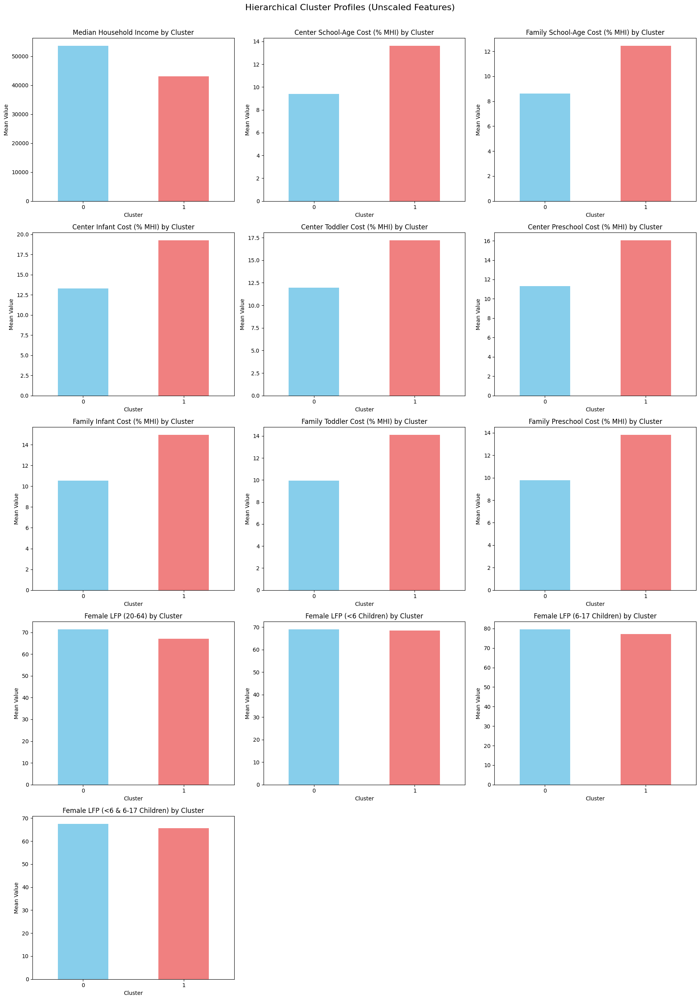

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get the feature names for plotting
plot_features = selected_columns

# Create a mapping for more readable titles
feature_display_names = {
    'mhi_2018': 'Median Household Income',
    'mcsa_as_percent_mhi': 'Center School-Age Cost (% MHI)',
    'mfccsa_as_percent_mhi': 'Family School-Age Cost (% MHI)',
    'mc_infant_as_percent_mhi': 'Center Infant Cost (% MHI)',
    'mc_toddler_as_percent_mhi': 'Center Toddler Cost (% MHI)',
    'mc_preschool_as_percent_mhi': 'Center Preschool Cost (% MHI)',
    'mfcc_infant_as_percent_mhi': 'Family Infant Cost (% MHI)',
    'mfcc_toddler_as_percent_mhi': 'Family Toddler Cost (% MHI)',
    'mfcc_preschool_as_percent_mhi': 'Family Preschool Cost (% MHI)',
    'flfpr_20to64': 'Female LFP (20-64)',
    'flfpr_20to64_under6': 'Female LFP (<6 Children)',
    'flfpr_20to64_6to17': 'Female LFP (6-17 Children)',
    'flfpr_20to64_under6_6to17': 'Female LFP (<6 & 6-17 Children)'
}

# Determine number of rows and columns for subplots
num_features = len(plot_features)
num_cols = 3  # Display 3 plots per row
num_rows = (num_features + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

for i, feature in enumerate(plot_features):
    ax = axes[i]
    h_cluster_means[feature].plot(kind='bar', ax=ax, rot=0, color=['skyblue', 'lightcoral'])
    ax.set_title(f'{feature_display_names.get(feature, feature)} by Cluster')
    ax.set_xlabel('Cluster')
    ax.set_ylabel('Mean Value')
    ax.tick_params(axis='x', labelsize=10) # Adjust x-axis label size

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Hierarchical Cluster Profiles (Unscaled Features)', y=1.02, fontsize=16)
plt.show()

### Summary of Hierarchical Cluster Characteristics

The hierarchical clustering analysis, using an optimal number of 2 clusters as suggested by the dendrogram, revealed similar patterns to the K-Means clustering. The clusters differentiate primarily based on income, childcare cost burden, and female labor force participation rates.

*   **Hierarchical Cluster 0** (Larger Cluster with 24,222 entries):
    *   **Higher Median Household Income**: The mean median household income for this cluster is approximately $53,603.90, which is higher than Cluster 1.
    *   **Lower Childcare Costs as Percentage of MHI**: Childcare costs across all categories (center-based, family childcare, and all age groups) are consistently lower as a percentage of MHI compared to Cluster 1. For example, 'mcsa_as_percent_mhi' is 9.38% for Cluster 0 vs. 13.61% for Cluster 1.
    *   **Higher Female Labor Force Participation (LFP) Rates**: Female LFP rates, including general LFP (20-64 years), and LFP with children under 6 and 6-17 years, are generally higher in this cluster. For instance, 'flfpr_20to64' is 71.35% for Cluster 0 vs. 67.13% for Cluster 1.

*   **Hierarchical Cluster 1** (Smaller Cluster with 10,345 entries):
    *   **Lower Median Household Income**: This cluster has a mean median household income of approximately $43,054.63, indicating lower-income counties.
    *   **Higher Childcare Costs as Percentage of MHI**: Conversely, childcare costs are a greater burden in this cluster, being significantly higher as a percentage of MHI across all types and age groups. For example, 'mc_infant_as_percent_mhi' is 19.25% for Cluster 1 vs. 13.29% for Cluster 0.
    *   **Lower Female Labor Force Participation (LFP) Rates**: Female LFP rates are lower across all categories, reflecting potentially greater challenges for women in the workforce in these counties.

The bar charts visually reinforce these differences, clearly showing the contrast in income levels, the relative affordability of childcare, and female engagement in the labor force between the two hierarchical clusters. This indicates a strong relationship between economic prosperity, childcare accessibility, and women's labor market outcomes.

### Summary of Hierarchical Cluster Characteristics

The hierarchical clustering analysis, using an optimal number of 2 clusters as suggested by the dendrogram, revealed similar patterns to the K-Means clustering. The clusters differentiate primarily based on income, childcare cost burden, and female labor force participation rates.

*   **Hierarchical Cluster 0** (Larger Cluster with 24,222 entries):
    *   **Higher Median Household Income**: The mean median household income for this cluster is approximately $53,603.90, which is higher than Cluster 1.
    *   **Lower Childcare Costs as Percentage of MHI**: Childcare costs across all categories (center-based, family childcare, and all age groups) are consistently lower as a percentage of MHI compared to Cluster 1. For example, 'mcsa_as_percent_mhi' is 9.38% for Cluster 0 vs. 13.61% for Cluster 1.
    *   **Higher Female Labor Force Participation (LFP) Rates**: Female LFP rates, including general LFP (20-64 years), and LFP with children under 6 and 6-17 years, are generally higher in this cluster. For instance, 'flfpr_20to64' is 71.35% for Cluster 0 vs. 67.13% for Cluster 1.

*   **Hierarchical Cluster 1** (Smaller Cluster with 10,345 entries):
    *   **Lower Median Household Income**: This cluster has a mean median household income of approximately $43,054.63, indicating lower-income counties.
    *   **Higher Childcare Costs as Percentage of MHI**: Conversely, childcare costs are a greater burden in this cluster, being significantly higher as a percentage of MHI across all types and age groups. For example, 'mc_infant_as_percent_mhi' is 19.25% for Cluster 1 vs. 13.29% for Cluster 0.
    *   **Lower Female Labor Force Participation (LFP) Rates**: Female LFP rates are lower across all categories, reflecting potentially greater challenges for women in the workforce in these counties.

The bar charts visually reinforce these differences, clearly showing the contrast in income levels, the relative affordability of childcare, and female engagement in the labor force between the two hierarchical clusters. This indicates a strong relationship between economic prosperity, childcare accessibility, and women's labor market outcomes.


## Comprehensive Clustering Analysis Summary

This analysis employed both K-Means and Hierarchical Clustering techniques to segment counties based on key socio-economic indicators related to childcare costs and female labor force participation rates. Both methods consistently identified two primary clusters, indicating robust differentiation in the dataset.

### Key Findings (Integrated from both K-Means and Hierarchical Clustering)

Both clustering approaches converged on a similar division of counties, effectively categorizing them into two distinct groups:

*   **Cluster 0 (Higher Income, Lower Childcare Cost Burden, Higher Female LFP)**:
    *   **Economic Profile**: Characterized by significantly higher median household incomes (e.g., K-Means Cluster 0: ~$55,226; Hierarchical Cluster 0: ~$53,603).
    *   **Childcare Affordability**: Childcare costs across all types (center-based, family childcare) and age groups (infant, toddler, preschool, school-age) are consistently lower when expressed as a percentage of median household income (e.g., K-Means mc_infant_as_percent_mhi: ~12.74%; Hierarchical mc_infant_as_percent_mhi: ~13.29%). This suggests that despite potentially higher absolute costs in some of these counties, the relative burden on households is lighter due to higher incomes.
    *   **Female Labor Force Participation**: These counties exhibit higher female labor force participation rates across all categories (general LFP for 20-64, with children under 6, with children 6-17, and with both age groups). (e.g., K-Means flfpr_20to64: ~72.51%; Hierarchical flfpr_20to64: ~71.35%). This correlation implies that lower childcare cost burden and higher income environments support greater female engagement in the workforce.

*   **Cluster 1 (Lower Income, Higher Childcare Cost Burden, Lower Female LFP)**:
    *   **Economic Profile**: Defined by lower median household incomes (e.g., K-Means Cluster 1: ~$43,212; Hierarchical Cluster 1: ~$43,054).
    *   **Childcare Affordability**: Childcare costs represent a substantially greater burden in these counties, consistently showing higher percentages of MHI across all childcare types and age groups (e.g., K-Means mc_infant_as_percent_mhi: ~18.59%; Hierarchical mc_infant_as_percent_mhi: ~19.25%). This indicates a significant financial strain on families for childcare services.
    *   **Female Labor Force Participation**: These counties demonstrate lower female labor force participation rates in all categories (e.g., K-Means flfpr_20to64: ~66.42%; Hierarchical flfpr_20to64: ~67.13%). The higher relative cost of childcare likely acts as a barrier, deterring women from entering or remaining in the labor force.

### Methodological Consistency

Both the Elbow Method and Silhouette Score for K-Means, and the dendrogram for Hierarchical Clustering, pointed towards 2 as the optimal number of clusters. The resulting cluster profiles from both methods were strikingly similar, reinforcing the robustness of the identified segments within the data.



# **Visualization-Map**


Ensure the `merged_df` contains the `cluster_labels` and that the `county_fips_code` column is formatted correctly (e.g., as a string with leading zeros if necessary) for merging with geographic shapefiles.



Visualize the geographic distribution of the two clusters by plotting them on a map of the contiguous United States, and then summarize the observed patterns. Use "https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip" as the shapefile for US counties.

In [ ]:
print("First 5 rows of 'county_fips_code':")
print(merged_df['county_fips_code'].head())
print("\nData type of 'county_fips_code':")
print(merged_df['county_fips_code'].dtype)

print("\nValue counts for 'cluster_labels':")
print(merged_df['cluster_labels'].value_counts())

First 5 rows of 'county_fips_code':
0    01001
1    01001
2    01001
3    01001
4    01001
Name: county_fips_code, dtype: object

Data type of 'county_fips_code':
object

Value counts for 'cluster_labels':
cluster_labels
0    20814
1    13753
Name: count, dtype: int64



The previous output showed that `county_fips_code` is a string type but did not confirm if all values have 5 digits with leading zeros. To ensure proper merging with the GeoDataFrame, I need to explicitly apply `.str.zfill(5)` to the `county_fips_code` column in `merged_df`.



In [ ]:
merged_df['county_fips_code'] = merged_df['county_fips_code'].astype(str).str.zfill(5)
print("First 5 rows of 'county_fips_code' after zfill:")
print(merged_df['county_fips_code'].head())

First 5 rows of 'county_fips_code' after zfill:
0    01001
1    01001
2    01001
3    01001
4    01001
Name: county_fips_code, dtype: object


In [ ]:
import geopandas as gpd

# Load the US counties shapefile
counties_geo = gpd.read_file(
    "https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip"
)

# Ensure the 'GEOID' column in the geographic data is a string for merging
counties_geo['GEOID'] = counties_geo['GEOID'].astype(str)

# Merge the geographic data with our merged_df on FIPS codes
map_df_clusters = counties_geo.merge(
    merged_df[['county_fips_code', 'cluster_labels']].drop_duplicates(subset=['county_fips_code']),
    left_on='GEOID',
    right_on='county_fips_code',
    how='left'
)

# Filter for contiguous US states to simplify the map visualization
contiguous_clusters = map_df_clusters[
    ~map_df_clusters['STATEFP'].isin(['02', '15', '60', '66', '69', '72', '78'])
]

print("First 5 rows of contiguous_clusters GeoDataFrame:")
print(contiguous_clusters.head())
print("\nValue counts of cluster_labels in contiguous_clusters:")
print(contiguous_clusters['cluster_labels'].value_counts(dropna=False))

First 5 rows of contiguous_clusters GeoDataFrame:
  STATEFP COUNTYFP  COUNTYNS        AFFGEOID  GEOID       NAME  \
0      20      161  00485044  0500000US20161  20161      Riley   
1      19      159  00465268  0500000US19159  19159   Ringgold   
2      30      009  01720111  0500000US30009  30009     Carbon   
3      16      007  00395090  0500000US16007  16007  Bear Lake   
4      55      011  01581065  0500000US55011  55011    Buffalo   

           NAMELSAD STUSPS STATE_NAME LSAD       ALAND     AWATER  \
0      Riley County     KS     Kansas   06  1579077672   32047392   
1   Ringgold County     IA       Iowa   06  1386932347    8723135   
2     Carbon County     MT    Montana   06  5303728455   35213028   
3  Bear Lake County     ID      Idaho   06  2527123155  191364281   
4    Buffalo County     WI  Wisconsin   06  1750290818   87549529   

                                            geometry county_fips_code  \
0  POLYGON ((-96.96095 39.2867, -96.96106 39.2885...            2

**Reasoning**:
With the `contiguous_clusters` GeoDataFrame prepared, I will now create a choropleth map to visualize the geographic distribution of the clusters across the contiguous United States. This will help identify any spatial patterns in the clustering.



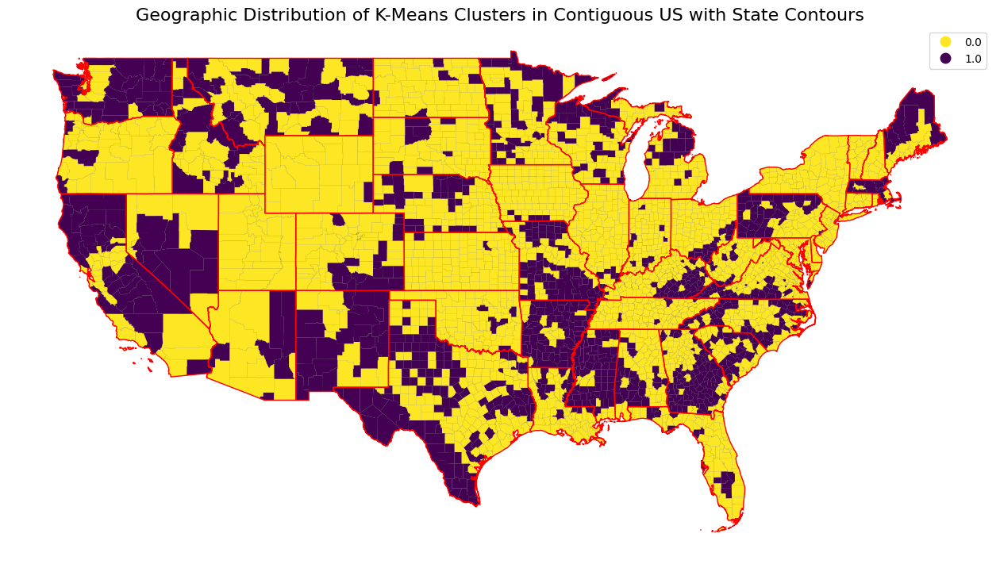

In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd

fig, ax = plt.subplots(1, 1, figsize=(16, 12))

# Ensure cluster 0 is light, cluster 1 is dark

contiguous_clusters.plot(
    column='cluster_labels',
    cmap='viridis_r', # Changed to viridis_r to make Cluster 0 light and Cluster 1 dark
    linewidth=0.05,
    edgecolor='black',
    legend=True,
    ax=ax,
    categorical=True # Treat cluster_labels as categorical data
)

# Load state boundaries
states_geo = gpd.read_file(
    "https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip"
)

# Filter for contiguous US states to match the county map
contiguous_states = states_geo[
    ~states_geo['STATEFP'].isin(['02', '15', '60', '66', '69', '72', '78'])
]

# Plot state boundaries on top of the counties
contiguous_states.geometry.boundary.plot(ax=ax, edgecolor='red', linewidth=1)

ax.set_title(
    'Geographic Distribution of K-Means Clusters in Contiguous US with State Contours',
    fontsize=16
)
ax.set_axis_off() # Turn off the axis for a cleaner map

plt.show()

### Summary of Geographic Cluster Distribution

The choropleth map illustrates a distinct geographic distribution of the two identified clusters across the contiguous United States.

**Cluster 0 (Darker/Purple regions on the map)** appears to be more concentrated in the central and southern states, including a significant portion of the Midwest and parts of the South. Based on the `cluster_means` output, this cluster is characterized by **lower median household incomes and higher childcare costs as a percentage of MHI**, combined with generally **lower female labor force participation rates** across all categories (general, with children under 6, with children 6-17, and with both age groups).

**Cluster 1 (Lighter/Yellow regions on the map)** tends to dominate the coastal areas, particularly the Northeast and parts of the West Coast, as well as some urbanized areas within other states. This cluster, according to `cluster_means`, is associated with **higher median household incomes and lower childcare costs as a percentage of MHI**, alongside **higher female labor force participation rates** in all categories.

The spatial separation suggests that economic factors, childcare affordability, and labor market dynamics for women are not uniformly distributed but rather exhibit regional patterns. Areas with higher incomes and more affordable childcare (relative to income) tend to have higher female labor force participation, forming distinct geographic clusters.

## Summary:

### Q&A
The analysis identified two distinct clusters based on 2018 data:
*   **Cluster 0 (Higher Income, Lower Childcare Costs, Higher LFP)**: This cluster is characterized by higher median household income, lower childcare costs as a percentage of median household income (MHI) across all categories, and higher female labor force participation (LFP) rates.
*   **Cluster 1 (Lower Income, Higher Childcare Costs, Lower LFP)**: In contrast, this cluster exhibits lower median household income, significantly higher childcare costs as a percentage of MHI, and lower female LFP rates across all categories.

The clustering results demonstrate a clear relationship: counties with higher incomes experience a lower childcare cost burden relative to income, which is associated with higher female labor force participation. Conversely, counties with lower incomes face a greater relative childcare cost burden, correlating with reduced female labor force participation. This suggests that childcare affordability and overall economic conditions are crucial factors influencing women's engagement in the workforce.

### Data Analysis Key Findings
*   The K-Means clustering algorithm successfully partitioned the 2018 dataset into two distinct clusters: Cluster 0 with 1,728 entries and Cluster 1 with 1,414 entries.
*   **Cluster 0** is characterized by higher median household income, with generally positive deviations from the mean for income and labor force participation, and negative deviations for childcare costs (when scaled).
*   **Cluster 1** is characterized by lower median household income, with generally negative deviations from the mean for income and labor force participation, and positive deviations for childcare costs (when scaled).
*   Radar charts and bar charts visually confirmed these patterns, showing that for Cluster 0, mean median household income and female labor force participation rates are higher, while childcare costs as a percentage of MHI are consistently lower across all categories.
*   For Cluster 1, mean median household income and female labor force participation rates are lower, while childcare costs as a percentage of MHI are consistently higher across all categories.
*   A strong inverse relationship was observed between household income and the burden of childcare costs: as income increases, the relative cost of childcare decreases.
*   A direct relationship was observed between household income and female labor force participation: higher income correlates with higher female LFP rates.

### Insights or Next Steps
*   Childcare affordability appears to be a significant barrier to female labor force participation, particularly in lower-income areas where childcare costs consume a larger proportion of household income.
*   Further analysis could explore the specific demographic and geographic characteristics of counties within each cluster to understand underlying causal factors and inform targeted policy interventions.
